In [77]:
import cv2
import matplotlib.pyplot as plt
import deepdish as dd
import numpy as np
import random
import time
import math

data = dd.io.load("dataset/fabric_pose_class_0423.h5")

X, Y = data["X"], data["Y"]
X, Y = np.array(X), np.array(Y)
X.shape

# Y[:,2] /= 90.

(28200, 2, 90, 120, 3)

In [4]:
from util.reconstruction import Class_3D
from util.reconstruction import demark
from util import helper

# sensor_id = "W00"
sensor_id = "Fabric"
model_id = "RGB"
model_fn = f"models/LUT_{sensor_id}_{model_id}.pkl"
c3d = Class_3D(model_fn=model_fn, features_type=model_id)

In [3]:
print("X_max", X.max(), "X_min", X.min())

X_max 0.9269195 X_min -0.12399125


In [78]:
idx = list(range(X.shape[0]))
random.shuffle(idx)
X, Y = X[idx], Y[idx]
Y_theta = np.hstack([
    Y[:, :2], 
#     Y[:, [0]] - Y[:, [1]]*np.tan(Y[:, [2]]/ 180. * np.pi),
    np.sin(Y[:, [2]]  / 180. * np.pi),
    np.cos(Y[:,[2]] / 180. * np.pi),
    Y[:, [-1]]          
])

# Y_theta = np.hstack([Y, np.cos(Y[:,[2]] / 180. * np.pi)])
# Y_theta[:, 2] = np.sin(Y_theta[:, 2] / 180. * np.pi)

N = int(X.shape[0] * 0.8)
X_train, Y_train = np.concatenate((X[:N, 1], X[:N, 0]), axis=3), Y_theta[:N]
X_test, Y_test = np.concatenate((X[N:, 1], X[N:, 0]), axis=3), Y_theta[N:]

In [8]:
X_test.shape

(5600, 90, 120, 6)

In [51]:
X_test[0][:,:,:3].shape

(90, 120, 3)

In [79]:
import torch
import torch.nn as nn
import torch.nn.functional as F


class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(6, 6, 5)#(3, 6, 5)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.conv3 = nn.Conv2d(16, 32, 5)
#         self.conv4 = nn.Conv2d(32, 128, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.fc1 = nn.Linear(32 * 7 * 11, 512)
#         self.fc1 = nn.Linear(128 * 1 * 3, 120)
        self.fc2 = nn.Linear(512, 128)
        self.fc3 = nn.Linear(128, 8)

    def forward(self, x):
        x = x.permute(0, 3, 1, 2)
        x = torch.tanh(self.conv1(x))
        x = self.pool(x)
        x = torch.tanh(self.conv2(x))
        x = self.pool(x)
        x = torch.tanh(self.conv3(x))
        x = self.pool(x)
#         x = self.pool(torch.tanh(self.conv4(x)))
#         x = x.permute(0, 2, 3, 1)
#         print(x.size())
        x = x.reshape(-1, 32 * 7 * 11)
        x = F.leaky_relu(self.fc1(x))
        x = F.leaky_relu(self.fc2(x))
        x = self.fc3(x)
        return x

    def fit(self, X_train, Y_train, device, lrate=0.01, num_iters=100):
        batch_size = 64
        N = X_train.shape[0]


        optim = torch.optim.Adam(self.parameters(), lr=lrate)
        sum_loss = 0
        total = 0
        
        for epoch in range(num_iters):
            
#             sum_loss = 0
#             total = 0
        
            
            if epoch % 5 == 0:
                idx = list(range(N))
                random.shuffle(idx)

                X_train = X_train[idx]
                Y_train = Y_train[idx]
        
            for i in range(N // batch_size):
                # clear gradients accumulated on the parameters
                optim.zero_grad()
                
                x_np = X_train[i * batch_size : (i + 1) * batch_size].copy()
#                 for img in x_np:
#                     for c in range(3):
#                         img[:,:,c] = np.clip(img[:,:,c]*(1.15 - np.random.random() * 0.3), 0, 255)
#                         img[:,:,c] = np.clip(img[:,:,c]*(1.5 - np.random.random() * 1), 0, 255)
                x = torch.tensor(x_np, dtype=torch.float32).to(device)

                # get an input (say we only care inputs sampled from N(0, I))
                # x = torch.randn(batch_size, 8, device=cuda0)  # this has to be on GPU too
#                 x = torch.tensor(
#                     X_train[i * batch_size : (i + 1) * batch_size], dtype=torch.float32
#                 ).to(device)
                y = torch.tensor(
                    Y_train[i * batch_size : (i + 1) * batch_size], dtype=torch.float32
                ).to(device)

                # forward pass
                result = self.forward(x)  # CHANGED: fc => net

                # compute loss
                loss = 0
                s_sqrt = result[:, 4]
                for j in range(4):
                    m = result[:, j]
                    loss += (((m-y[:, j])**2)*(y[:, 4] == 1)).mean()
#                     loss += (((y[:, j]-m)**2/(2*s_sqrt**4) + (math.sqrt(2*math.pi)*s_sqrt**2).log()) * (y[:, 4] == 1)).mean()*0.5
                criterion = nn.CrossEntropyLoss()   
                loss += criterion(result[:, 5:], y[:, 4].long())*0.01

                # compute gradients
                loss.backward()

                # let the optimizer do its work; the parameters will be updated in this call
                optim.step()

                sum_loss += loss.item()
#                 if i % 100 == 0:
#                     print(loss.item())
                total += 1
                # add some printing
            if (epoch + 1) % 1 == 0:
                print(
                    "epoch {}\titeration {}\tloss {:.8f}".format(
                        epoch, i, sum_loss / total
                    )
                )

    def predict(self, X_test, device):
        with torch.no_grad():
            return self.forward(torch.tensor(X_test, dtype=torch.float32).to(device)).cpu().numpy()


device = torch.device("cuda:0")

# x = torch.tensor(X[:5], dtype=torch.float32).to(device)
# y = net(x)
# print(y.size())

In [7]:
net = Net().to(device)

In [86]:
# net.fit(X_train, Y_train, device, lrate=0.000001)
net.fit(X_train, Y_train, device, lrate=0.0001, num_iters=1000)

epoch 0	iteration 351	loss 0.00012574
epoch 1	iteration 351	loss 0.00009482
epoch 2	iteration 351	loss 0.00007663
epoch 3	iteration 351	loss 0.00006673
epoch 4	iteration 351	loss 0.00006220
epoch 5	iteration 351	loss 0.00006580
epoch 6	iteration 351	loss 0.00006796
epoch 19	iteration 351	loss 0.00006483
epoch 20	iteration 351	loss 0.00006498
epoch 21	iteration 351	loss 0.00006523
epoch 22	iteration 351	loss 0.00006495
epoch 23	iteration 351	loss 0.00006510
epoch 24	iteration 351	loss 0.00006658
epoch 25	iteration 351	loss 0.00006621
epoch 26	iteration 351	loss 0.00006539
epoch 27	iteration 351	loss 0.00006469
epoch 28	iteration 351	loss 0.00006438
epoch 29	iteration 351	loss 0.00006505
epoch 30	iteration 351	loss 0.00006520
epoch 31	iteration 351	loss 0.00006482
epoch 32	iteration 351	loss 0.00006432
epoch 33	iteration 351	loss 0.00006414
epoch 34	iteration 351	loss 0.00006462
epoch 35	iteration 351	loss 0.00006453
epoch 36	iteration 351	loss 0.00006419
epoch 37	iteration 351	loss 0.00

epoch 220	iteration 351	loss 0.00006205
epoch 221	iteration 351	loss 0.00006196
epoch 222	iteration 351	loss 0.00006188
epoch 223	iteration 351	loss 0.00006186
epoch 224	iteration 351	loss 0.00006187
epoch 225	iteration 351	loss 0.00006180
epoch 226	iteration 351	loss 0.00006172
epoch 227	iteration 351	loss 0.00006164
epoch 228	iteration 351	loss 0.00006158
epoch 229	iteration 351	loss 0.00006153
epoch 230	iteration 351	loss 0.00006150
epoch 231	iteration 351	loss 0.00006150
epoch 232	iteration 351	loss 0.00006153
epoch 233	iteration 351	loss 0.00006153
epoch 234	iteration 351	loss 0.00006147
epoch 235	iteration 351	loss 0.00006138
epoch 236	iteration 351	loss 0.00006130
epoch 237	iteration 351	loss 0.00006121
epoch 238	iteration 351	loss 0.00006119
epoch 239	iteration 351	loss 0.00006134
epoch 240	iteration 351	loss 0.00006127
epoch 241	iteration 351	loss 0.00006116
epoch 242	iteration 351	loss 0.00006105
epoch 243	iteration 351	loss 0.00006096
epoch 244	iteration 351	loss 0.00006093


epoch 425	iteration 351	loss 0.00005718
epoch 426	iteration 351	loss 0.00005709
epoch 427	iteration 351	loss 0.00005700
epoch 428	iteration 351	loss 0.00005690
epoch 429	iteration 351	loss 0.00005681
epoch 430	iteration 351	loss 0.00005678
epoch 431	iteration 351	loss 0.00005677
epoch 432	iteration 351	loss 0.00005678
epoch 433	iteration 351	loss 0.00005677
epoch 434	iteration 351	loss 0.00005677
epoch 435	iteration 351	loss 0.00005670
epoch 436	iteration 351	loss 0.00005663
epoch 437	iteration 351	loss 0.00005656
epoch 438	iteration 351	loss 0.00005652
epoch 439	iteration 351	loss 0.00005654
epoch 440	iteration 351	loss 0.00005652
epoch 441	iteration 351	loss 0.00005647
epoch 442	iteration 351	loss 0.00005643
epoch 443	iteration 351	loss 0.00005641
epoch 444	iteration 351	loss 0.00005644
epoch 445	iteration 351	loss 0.00005640
epoch 446	iteration 351	loss 0.00005635
epoch 447	iteration 351	loss 0.00005629
epoch 448	iteration 351	loss 0.00005624
epoch 449	iteration 351	loss 0.00005625


epoch 630	iteration 351	loss 0.00005205
epoch 631	iteration 351	loss 0.00005202
epoch 632	iteration 351	loss 0.00005199
epoch 633	iteration 351	loss 0.00005196
epoch 634	iteration 351	loss 0.00005196
epoch 635	iteration 351	loss 0.00005193
epoch 636	iteration 351	loss 0.00005189
epoch 637	iteration 351	loss 0.00005187
epoch 638	iteration 351	loss 0.00005186
epoch 639	iteration 351	loss 0.00005188
epoch 640	iteration 351	loss 0.00005184
epoch 641	iteration 351	loss 0.00005180
epoch 642	iteration 351	loss 0.00005174
epoch 643	iteration 351	loss 0.00005171
epoch 644	iteration 351	loss 0.00005171
epoch 645	iteration 351	loss 0.00005170
epoch 646	iteration 351	loss 0.00005168
epoch 647	iteration 351	loss 0.00005166
epoch 648	iteration 351	loss 0.00005164
epoch 649	iteration 351	loss 0.00005165
epoch 650	iteration 351	loss 0.00005162
epoch 651	iteration 351	loss 0.00005157
epoch 652	iteration 351	loss 0.00005154
epoch 653	iteration 351	loss 0.00005152
epoch 654	iteration 351	loss 0.00005154


epoch 835	iteration 351	loss 0.00004903
epoch 836	iteration 351	loss 0.00004900
epoch 837	iteration 351	loss 0.00004898
epoch 838	iteration 351	loss 0.00004896
epoch 839	iteration 351	loss 0.00004896
epoch 840	iteration 351	loss 0.00004895
epoch 841	iteration 351	loss 0.00004892
epoch 842	iteration 351	loss 0.00004890
epoch 843	iteration 351	loss 0.00004890
epoch 844	iteration 351	loss 0.00004891
epoch 845	iteration 351	loss 0.00004888
epoch 846	iteration 351	loss 0.00004885
epoch 847	iteration 351	loss 0.00004881
epoch 848	iteration 351	loss 0.00004879
epoch 849	iteration 351	loss 0.00004878
epoch 850	iteration 351	loss 0.00004876
epoch 851	iteration 351	loss 0.00004875
epoch 852	iteration 351	loss 0.00004874
epoch 853	iteration 351	loss 0.00004874
epoch 854	iteration 351	loss 0.00004873
epoch 855	iteration 351	loss 0.00004870
epoch 856	iteration 351	loss 0.00004867
epoch 857	iteration 351	loss 0.00004865
epoch 858	iteration 351	loss 0.00004865
epoch 859	iteration 351	loss 0.00004867


In [83]:
torch.save(net.state_dict(), "models/combined_2img_0426.pth")

In [85]:
net.load_state_dict(torch.load("models/combined_2img_0426.pth", map_location=device))

<All keys matched successfully>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[  0.10533288   0.34538692  -0.64246213   0.7673478   -0.5986853
 -26.400723    10.400678    -6.7566442 ] [ 0.10199089  0.34271171 -0.64258039  0.76621827  1.        ]
1.0
tensor([1.9240e-09, 1.0000e+00, 5.8568e-09])
tensor(1)
sigma:  0.010817519226012706


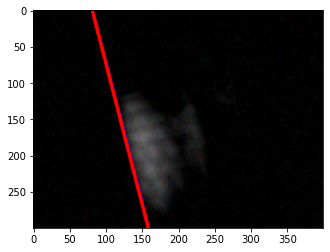

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0
tensor([4.8933e-17, 1.0000e+00, 3.5992e-13])
tensor(1)
sigma:  0.08589796642822023


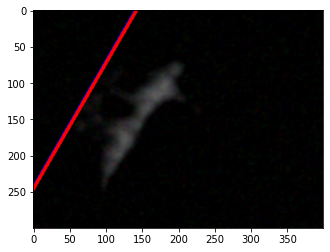

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0
tensor([7.0840e-11, 1.0000e+00, 9.0811e-10])
tensor(1)
sigma:  0.0002864094621637392


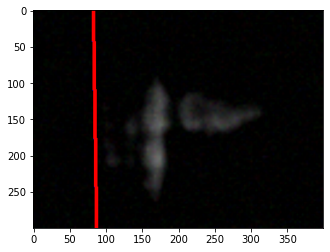

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0
tensor([2.3476e-09, 1.0000e+00, 3.8960e-07])
tensor(1)
sigma:  0.02544406809265909


KeyboardInterrupt: 

In [9]:
Y_pred = net.predict(X_test, device)
# Y_pred = Y_test
i = 2
print(Y_pred[i], Y_test[i])


def draw_line(img, theta, x0, y0, color=(0, 0, 1)):
    theta = theta / 180. * np.pi
    img = img.copy()
    rows, cols = img.shape[:2]
    
    center = np.array([x0 * cols, y0 * rows])
    
    d = 1100
    
    start_point = center + (d * np.sin(theta), d * np.cos(theta))
    end_point = center - (d * np.sin(theta), d * np.cos(theta))
    
    start_point = tuple(start_point.astype(np.int))
    end_point = tuple(end_point.astype(np.int))

#     color = (0, 0, 1)
    thickness = 4
    
    img = cv2.line(img, start_point, end_point, color, thickness) 
    return img


def imshow(im, vmin=0, vmax=1):
    plt.imshow(im[:,:,::-1], vmax=vmax, vmin=vmin)
    plt.show()
    
for i in range(50, 150):
    x, y = X_test[i][:,:,:3], Y_pred[i]
    print(Y_test[i][-1])
    probs = torch.softmax(torch.from_numpy(y[5:]), dim=0)
    winner = probs.argmax(dim=0)
    print(probs)
    print(winner)
    print("sigma: ", y[4]**2)
    
    x = cv2.resize(x, (400, 300))
    theta = np.arctan2(y[2], y[3])
    theta_gt = np.arctan2(y[2], y[3])
    
#     x_int = y[0] - y[1]*np.tan(theta)
#     rendered_img_line = draw_line(x, theta / np.pi * 180., y[0], 0)
    rendered_img_linegt = draw_line(x, theta/np.pi*180., Y_test[i][0], Y_test[i][1], (1, 0, 0))
    rendered_img_line = draw_line(rendered_img_linegt, theta/np.pi*180., y[0], y[1], (0, 0, 1))
    
    imshow(rendered_img_line)

In [74]:
frames = dd.io.load("data/fabric_0319_1.h5")

In [62]:
len(frames)

2907

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(2)
sigma:  0.24878578158273967


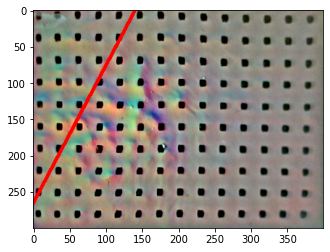

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(2)
sigma:  0.35769338770152004


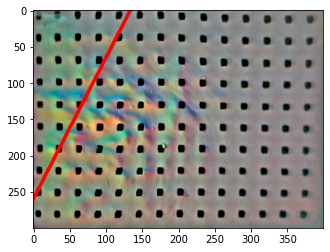

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(2)
sigma:  0.48686799980318085


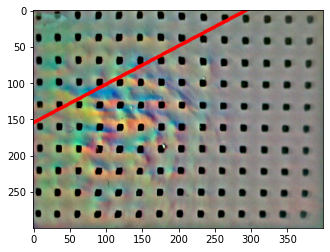

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(2)
sigma:  0.22726352624091817


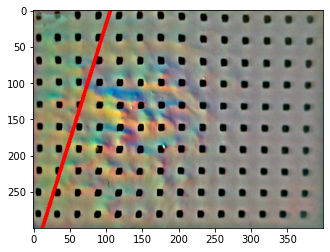

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(2)
sigma:  0.15933058332212013


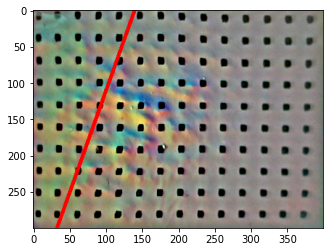

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(2)
sigma:  0.12430171529427358


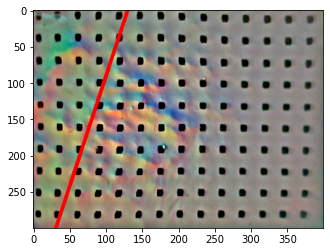

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.3595763642892713


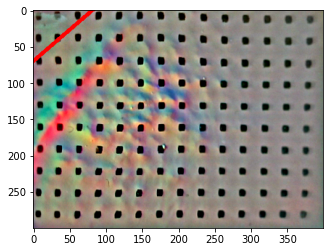

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.44816232479769624


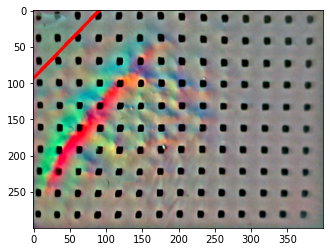

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.14091245603853864


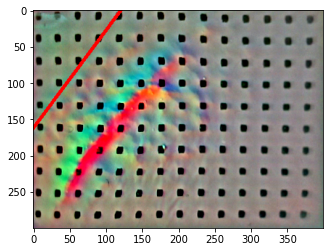

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.12336912526073807


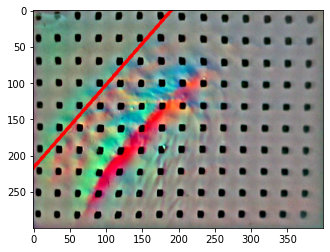

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.11591889829338697


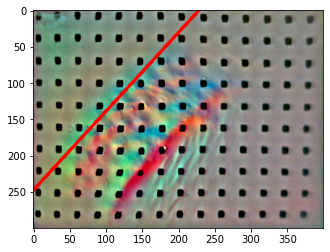

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.11903618603999266


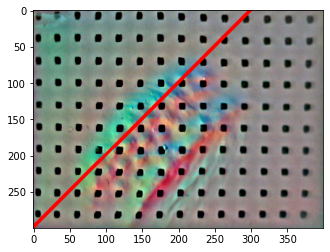

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.07888579201812718


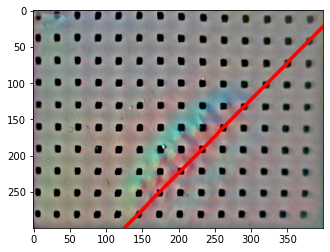

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.04910327603722764


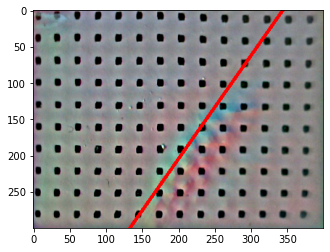

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.03590645084213784


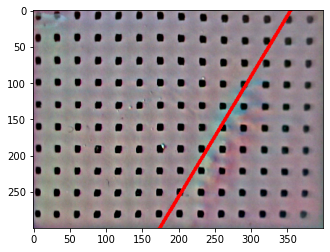

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.01182635844735902


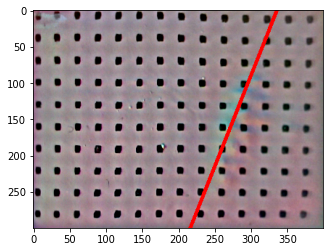

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.006352359686290221


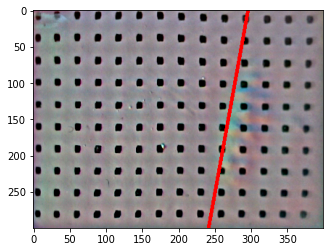

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.013604684866521888


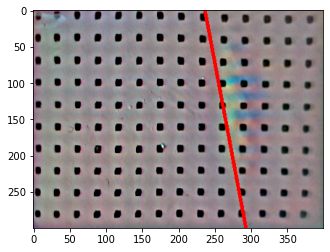

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.02427134161750022


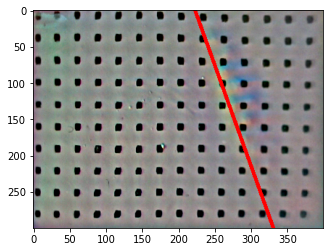

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.05519619789249308


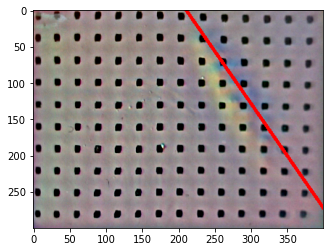

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.06862377535657416


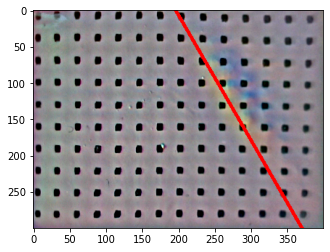

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0006744051447162835


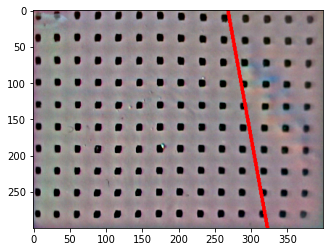

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0038573752974722098


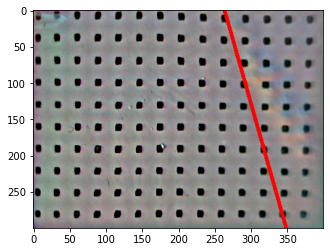

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  2.2517455983486756e-05


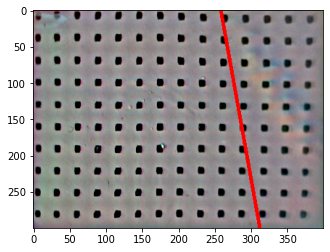

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0005280600635479971


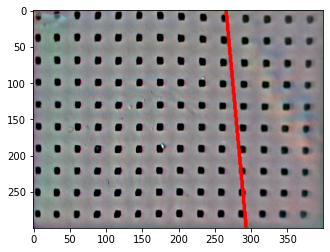

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.000760609164102144


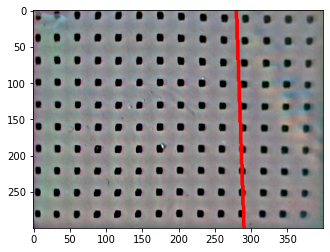

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(0)
sigma:  0.010472145423096046


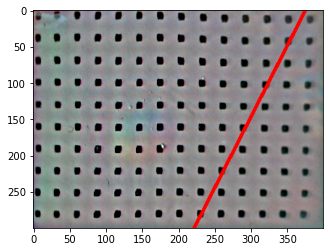

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0008422131719543341


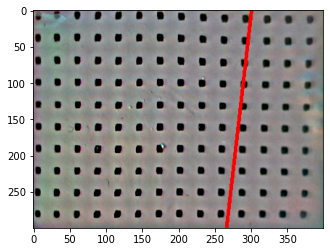

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0017101601414660217


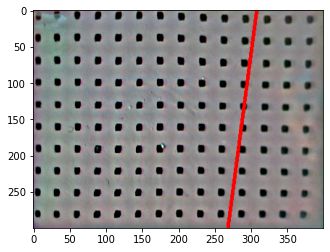

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0005076846959842229


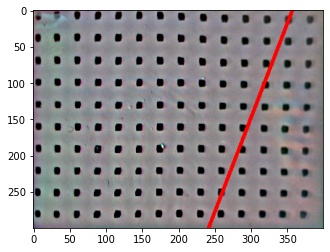

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  1.0204519313106175e-05


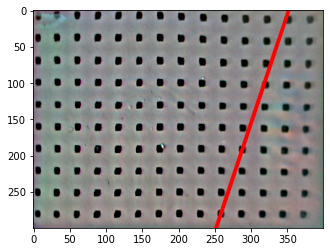

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0034941225469966586


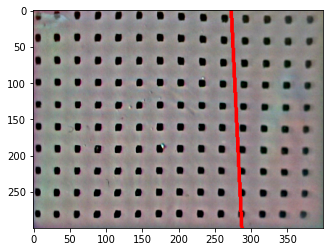

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.003064010369017281


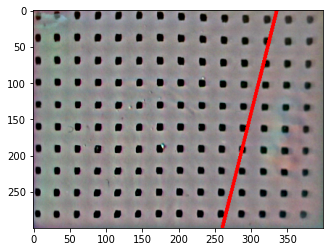

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  5.517072526833866e-05


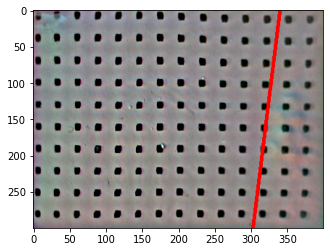

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  5.336743330591753e-05


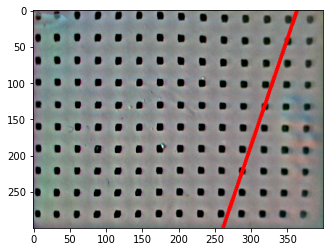

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.00899020652759952


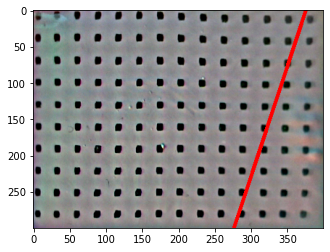

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0023439986611448888


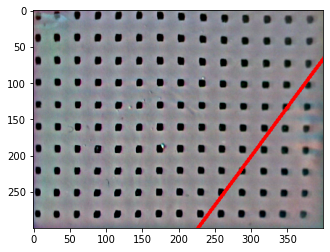

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.021302791362068696


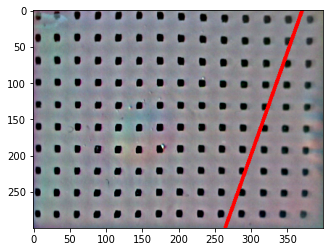

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(0)
sigma:  0.0007917592325799166


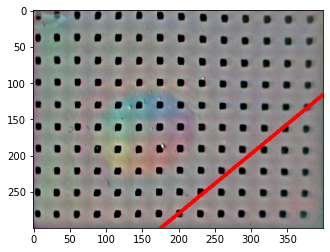

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(0)
sigma:  0.0034610351404240763


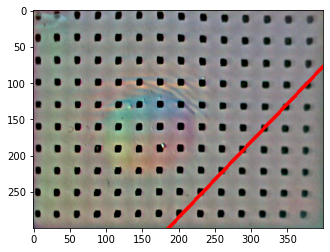

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(0)
sigma:  0.0012383120585477414


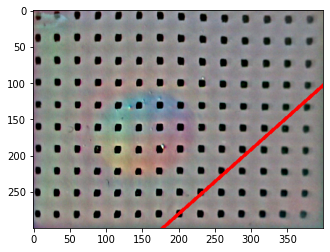

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0001265344322389783


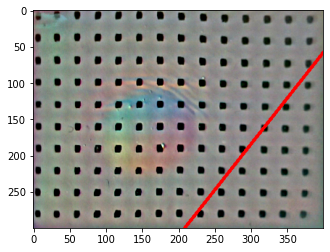

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(0)
sigma:  0.001641103465445326


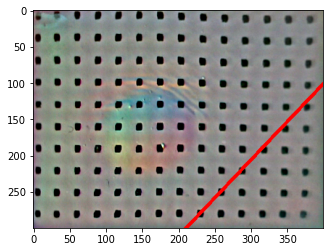

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(0)
sigma:  0.00011283634827165268


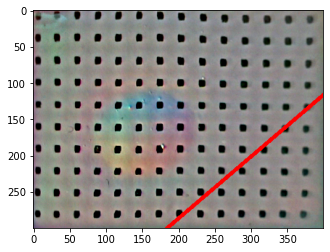

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(0)
sigma:  0.004405424323188856


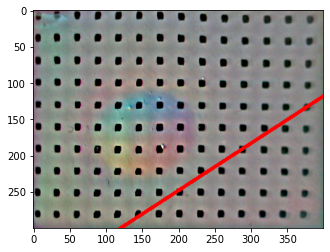

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(0)
sigma:  0.007303000235979518


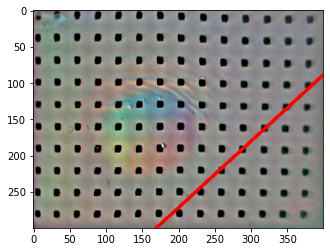

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(0)
sigma:  0.033756003363088816


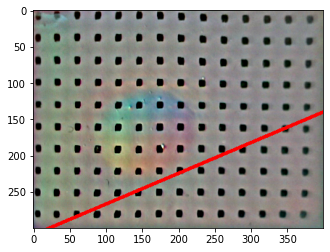

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(0)
sigma:  0.011618319655149145


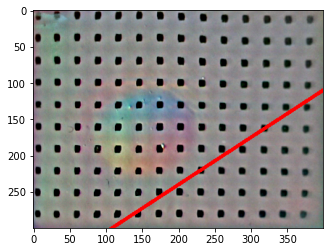

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(0)
sigma:  0.006369975196696354


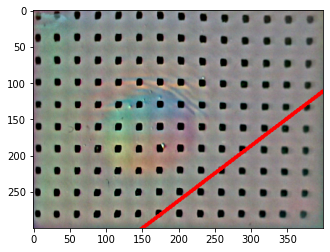

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(0)
sigma:  0.014676846367456031


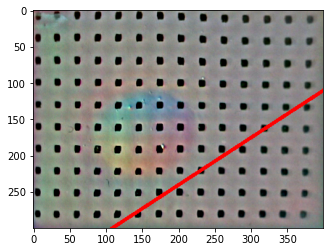

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(0)
sigma:  0.0007475282841709063


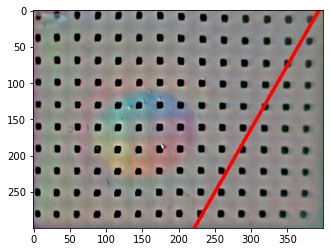

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(0)
sigma:  0.007867988088508193


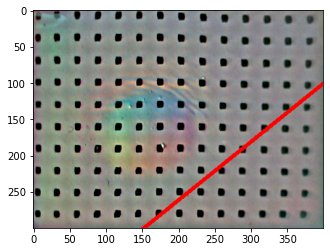

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(0)
sigma:  0.0005123662372975707


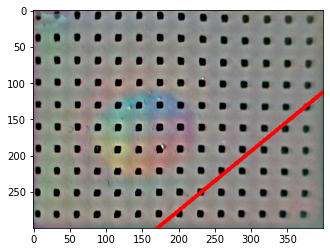

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(0)
sigma:  0.007112012595650308


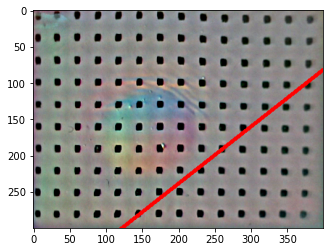

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(0)
sigma:  0.002787039870613184


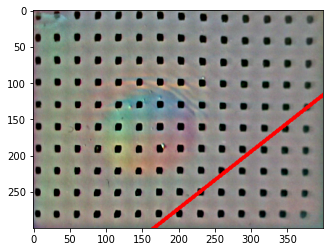

In [76]:
frame0 = frames[0]
# frame = frames[280]
frame = frames[460]
frame0_blur = cv2.GaussianBlur(frame0, (45, 45), 0)
# imgs = []

# for _ in range(150, 660, 3):
for _ in range(300, 850, 10):
# for _ in range(800, 2900, 30):
# for _ in range(420, 1020):
    frame = frames[_]
    diff_magnified = (frame * 1.0 - frame0_blur) / 255. * 4 + 0.5
    diff = (frame * 1.0 - frame0_blur) / 255. + 0.5
    diff_small = cv2.resize(diff, (120, 90))
    depth, gx, gy = c3d.infer(diff_small * 255.0, demark=demark, display=False)
#     depth3 = np.dstack([depth / 30] * 3)
    depth3 = np.dstack([depth] * 3)
#     rendered_small = cv2.resize(frame/255., (120, 90))

    frame0 = frames[_-1]
    diff0 = (frame * 1.0 - frame0_blur) / 255. + 0.5
    diff0_small = cv2.resize(diff, (120, 90))
    depth0, gx, gy = c3d.infer(diff_small * 255.0, demark=demark, display=False)
    depth03 = np.dstack([depth0] * 3)

#     Y_pred = net.predict([rendered_small], device)
    x = np.concatenate(([depth3 * 120/400], [depth03 * 120/400]), axis=3)
    Y_pred = net.predict(x, device)
    i = 0
#     x = rendered_small
    x = diff_small
    y = Y_pred[i]
    
    probs = torch.softmax(torch.from_numpy(y[5:]), dim=0)
    winner = probs.argmax(dim=0)
    print("category: ", winner)
    print("sigma: ", y[4]**2)

#     x = cv2.resize(x, (400, 300))
    x = diff_magnified
#     x = cv2.resize(depth3 * 120/400, (400, 300))
    theta = np.arctan2(y[2], y[3])
    rendered_img_line = draw_line(x, theta/np.pi*180., y[0], y[1])
#     rendered_img_line = draw_line(x, theta / np.pi * 180., y[0], 0)
    
    plt.figure()
    imshow(rendered_img_line)

#     imgs.append(rendered_img_line)


In [ ]:
np.save("results/fabric_sg_depth.npy", imgs)

In [634]:
import time

frame0 = frames[0]

t0 = time.time()

for _ in range(50, 850):
    frame = frames[_]
    diff = (frame * 1.0 - frame0) / 255. + 0.5
    diff_small = cv2.resize(diff, (120, 90))
    depth, gx, gy = c3d.infer(diff_small * 255.0, demark=demark, display=False)
    depth3 = np.dstack([depth] * 3)
#     depth_small = cv2.resize(depth3, (120, 90))
    
#     rendered_small = cv2.resize(diff, (120, 90))
#     rendered_small = cv2.resize(frame/255., (120, 90))

    Y_pred = net.predict([depth3*120/400], device)
#     i = 0
#     x = rendered_small
#     y = Y_pred[i]
#     print(Y_pred[i])

#     x = cv2.resize(x, (400, 300))
#     theta = np.arctan2(y[2], y[3])
#     rendered_img_line = draw_line(x, theta/np.pi*180., y[0], y[1])
#     plt.figure()
#     imshow(rendered_img_line)

tf = time.time()

print((tf-t0)/800)

# depth takes .16s (6 Hz)
# downscaled depth takes .035s (29Hz)
# rendered image takes 0.0176s (56Hz)
# difference image takes .0184s (54 Hz)
# network with classifier takes .03s (33 Hz)

0.030339207351207733


In [ ]:
frame0 = frames[0]
frame = frames[600]
diff = (frame * 1.0 - frame0) / 255. * 4 + 0.5
diff_small = cv2.resize(diff, (120, 90))
depth, gx, gy = c3d.infer(diff_small * 255.0, demark=demark, display=False)
depth2 = np.dstack([depth / 10] * 3)
print(depth2.shape)
plt.imshow(depth2)
# plt.imshow(depth, cmap="gray", vmin=0)


In [155]:
net.load_state_dict(torch.load("models/edge_markers_depth.pth", map_location=device))

<All keys matched successfully>

In [90]:
gt1 = dd.io.load("data/fabric_groundtruth1.h5")
gt2 = dd.io.load("data/fabric_groundtruth2.h5")
gt3 = dd.io.load("data/fabric_groundtruth3.h5")
gt4 = dd.io.load("data/fabric_groundtruth4.h5")
gt5 = dd.io.load("data/fabric_groundtruth5.h5")

In [158]:
sum_theta_error = 0
sum_xy_error = 0
total = 0

frame0 = gt3[0]
frame0_blur = cv2.GaussianBlur(frame0, (45, 45), 0)

for _ in range(308, 630):
    frame = gt1[_]
    diff = (frame * 1.0 - frame0_blur) / 255. * 4 + 0.5
#     diff_small = cv2.resize(diff, (120, 90))
    depth, gx, gy = c3d.infer(diff * 255.0, demark=demark, display=False)
    depth3 = np.dstack([depth / 30] * 3)
    depth3_small = cv2.resize(depth3, (120, 90))
    Y_pred = net.predict([depth3_small], device)
    y = Y_pred[0]
    theta = np.arctan2(y[2], y[3])
    x = np.zeros(3)
    
    # interpolated labels
    lo = 308
    hi = 400
    if _ < 400:
        x[0] = (_-lo)*1.*(157-144)/(hi-lo) + 144
        x[1] = (_-lo)*1.*(180-175)/(hi-lo) + 175
        x[2] = (_-lo)*1.*(-2+3)/(hi-lo) - 3
    elif _ < 500:
        lo = 400
        hi = 500
        x[0] = (_-lo)*1.*(175-157)/(hi-lo) + 157
        x[1] = (_-lo)*1.*(184-180)/(hi-lo) + 180
        x[2] = (_-lo)*1.*(-4+2)/(hi-lo) - 2
    elif _ < 600:
        lo = 500
        hi = 600
        x[0] = (_-lo)*1.*(183-175)/(hi-lo) + 175
        x[1] = (_-lo)*1.*(190-184)/(hi-lo) + 184
        x[2] = (_-lo)*1.*(-2+4)/(hi-lo) - 4
    else:
        lo = 600
        hi = 630
        x[0] = (_-lo)*1.*(186-183)/(hi-lo) + 144
        x[1] = (_-lo)*1.*(190-190)/(hi-lo) + 175
        x[2] = (_-lo)*1.*(-3+2)/(hi-lo) - 2
    
    total += 1
#     print("theta: ", theta)
#     print("x, y: ", y[0]*400, y[1]*300)
#     sum_theta_error += min(np.abs(theta - x[2]), np.abs(theta - x[2]-180), np.abs(theta - x[2]+180))
#     sum_xy_error += np.sqrt((y[0]*400-x[0])**2 + (y[1]*300-x[1])**2)
    sum_xy_error += np.abs((y[0]*400 - y[1]*300*np.tan(theta))-(x[0] - y[1]*np.tan(theta*np.pi/180.)))
    sum_xy_error += np.abs((y[0]*400 + (1-y[1])*300*np.tan(theta))-(x[0] + (300-y[1])*np.tan(theta*np.pi/180.)))
# print(sum_theta_error/total)
print(sum_xy_error/total/2)

#new error metric: distance off on y = 0 and y = 300 slice

# downsampled network
# theta error: 2.64
# x,y error: 27.6
# slice distance: 18.0 pixels

# downsampled input to depth network
# theta error: 2.95
# x,y error: 19.4
# slice distance: 15.5 pixels

# 400x300 input to depth network
# slice distance: 17.5 pixels
    

17.543741720750827


In [ ]:
theta0 = -3
x0, y0 = (179 , 187)

# augment( 150 , 206.5 , 127.0 , -5.404 )
# 225 , 287.0 , 165.5 , 19.911

frame = gt1[550]
rows, cols = frame.shape[:2]

diff = (frame * 1.0 - frame0_blur) / 255. * 1.0 + 0.5
diff_magnified = (diff - 0.5) * 4 + 0.5

# x = cv2.resize(frame, (400, 300)) / 255.
x = cv2.resize(diff_magnified, (400, 300))
# theta: in degrees
# x0: 0-1 (=>(0, cols))
# y0: 0-1 (=>(0, rows))
rendered_img_line = draw_line(x , theta0, x0 / cols, y0 / rows)
imshow(rendered_img_line)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.38280144  0.6069721  -0.11687976  0.9608073 ]


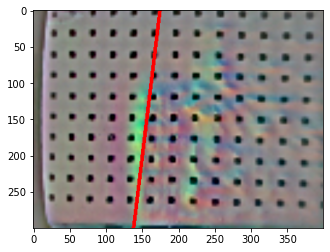

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.38993192  0.58262694 -0.19593298  0.9211087 ]


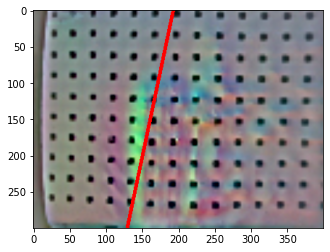

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.38577786  0.54114276 -0.07857265  0.98981833]


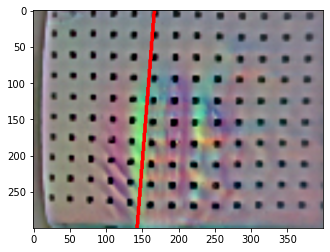

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.38428554  0.5409559  -0.0741008   1.001665  ]


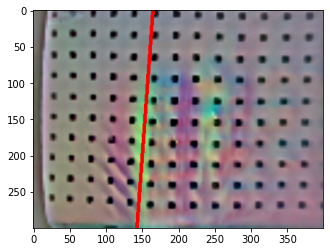

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.4124984  0.5118527 -0.1315355  1.0229918]


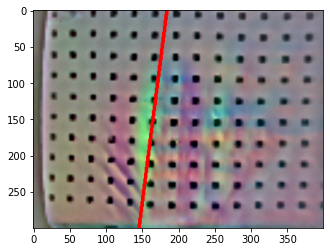

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.42061853  0.5134006  -0.10233923  1.0118659 ]


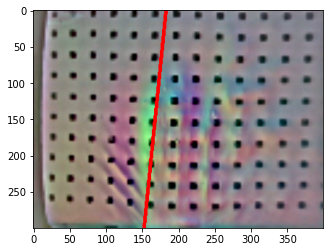

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.4275295   0.56250995 -0.04296184  1.0092454 ]


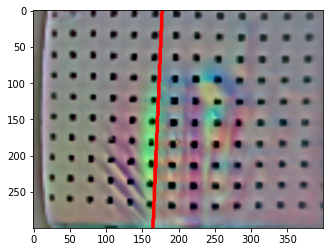

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.46909136  0.5337347  -0.05195249  0.968804  ]


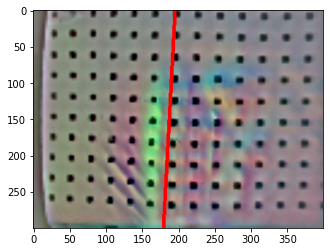

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.44347632  0.54660296 -0.0044944   1.0007352 ]


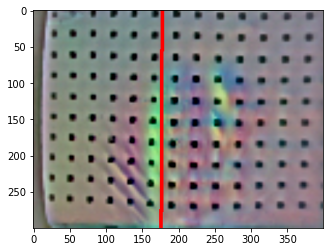

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.44308168  0.58079815 -0.00272046  0.9858583 ]


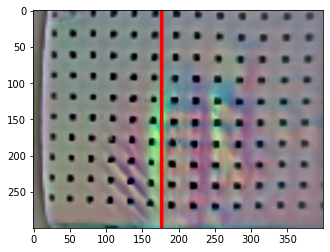

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.4530974   0.55843055 -0.00912806  0.97864354]


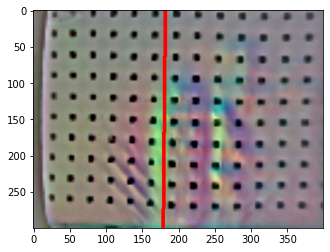

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.44268602  0.5591005  -0.03326003  1.0045288 ]


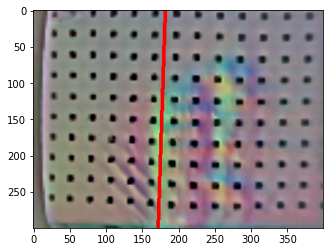

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.44563383  0.5982787  -0.04472212  1.0117211 ]


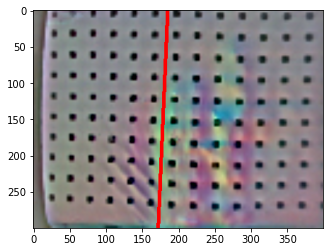

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.44760916  0.60815823 -0.03215832  0.9923972 ]


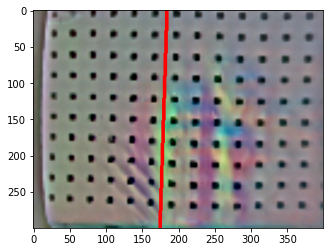

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.46780115  0.56897473 -0.11295242  0.9871731 ]


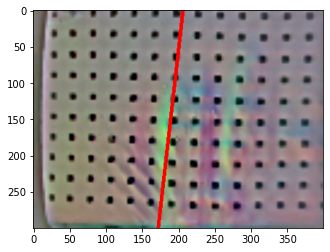

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.47212082  0.61812496 -0.03014159  0.99612784]


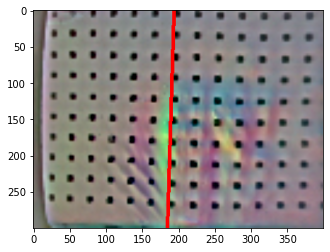

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.4794524   0.60198474 -0.09681144  1.0019214 ]


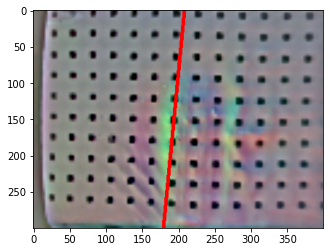

In [140]:
frame0 = gt3[0]
frame0_blur = cv2.GaussianBlur(frame0, (45, 45), 0)
# imgs = []

for _ in range(308, 630, 20):
    frame =gt1[_]
    diff = (frame * 1.0 - frame0_blur) / 255. * 3 + 0.5
    diff_small = cv2.resize(diff, (120, 90))
    depth, gx, gy = c3d.infer(diff_small * 255.0, demark=demark, display=False)
    depth3 = np.dstack([depth / 30] * 3)
#     rendered_small = cv2.resize(frame/255., (120, 90))

#     Y_pred = net.predict([rendered_small], device)
    Y_pred = net.predict([depth3], device)
    i = 0
#     x = rendered_small
    x = diff_small
    y = Y_pred[i]
    print(Y_pred[i])

    x = cv2.resize(x, (400, 300))
    theta = np.arctan2(y[2], y[3])
    rendered_img_line = draw_line(x, theta/np.pi*180., y[0], y[1])
    plt.figure()
    imshow(rendered_img_line)

#     imgs.append(rendered_img_line)
